In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import time
import ast
import collections
from wordcloud import WordCloud, STOPWORDS
import json

In [2]:
#### read val labels

with open('label_dictionary.json','r') as fp:
    label_dictionary_old = json.load(fp)

num_selected = 1000

val_labels = np.load('random_pairs_2k_new/val_labels_processed.npy')[:num_selected]
random_subembeddings = np.load('random_pairs_2k_new/cumulative_sub_embedding_output_1_random.npy')[:num_selected,:]
#random_embeddings = random_embeddings+np.random.randn(*random_embeddings.shape)/10000


# Compute 90th Percentile Thresholds for Sub-Embeddings Samples

In [12]:
# get embedding percentile thresholds

subembeddings_for_percentile_comp= np.squeeze(np.load('alexnet_imgnet_sub_embeddings_prelu_noise.npy'))
subembeddings_for_percentile_comp = subembeddings_for_percentile_comp + np.random.randn(*subembeddings_for_percentile_comp.shape)/10000
sorted_indices_subembedding = np.argsort(subembeddings_for_percentile_comp,axis = 0)
indices_90_subembedding = sorted_indices_subembedding[900,:]
subembedding_threshold_90 = subembeddings_for_percentile_comp[indices_90_subembedding, range(4096)].reshape(1,4096)

# Compute Number of Co-active Features Between Sub-Embeddings of All Pairs of Samples

In [13]:
random_subemb_active = (random_subembeddings >= subembedding_threshold_90)*1
random_subemb_active_t = random_subemb_active.T
random_subemb_active_expanded = np.expand_dims(random_subemb_active, axis=2)
random_subemb_active_t_expanded = np.expand_dims(random_subemb_active_t, axis=0)
co_active_feats = random_subemb_active_expanded*random_subemb_active_t_expanded
co_active_features_random_subemb = np.matmul(random_subemb_active,random_subemb_active_t)
co_active_features_random_subemb_sorted = np.argsort(-co_active_features_random_subemb,axis = 1)
average_random_subemb = np.mean(co_active_features_random_subemb)


[ 94  90 100 ...  95 103 117]


# Compute and Plot Histogram of Number of Co-Active Features Between All Pairs of Sub-Embeddings (sanity-check)

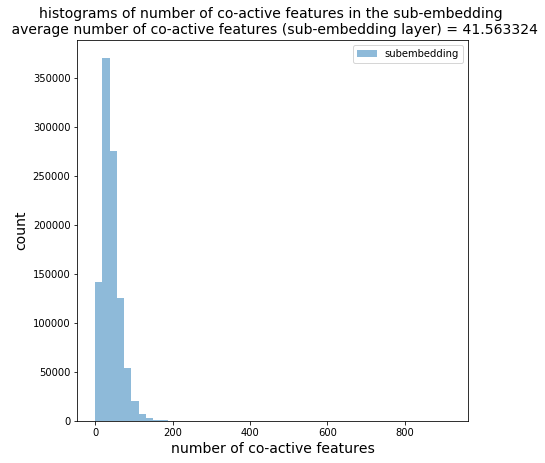

In [5]:
bins=np.linspace(np.min(co_active_features_random_subemb), np.max(co_active_features_random_subemb),50)
plt.figure(figsize=(7,7))
plt.title('histograms of number of co-active features in the sub-embedding \n average number of co-active features (sub-embedding layer) = '+str(average_random_subemb), fontsize=14)
plt.hist(co_active_features_random_subemb.flatten(),bins=bins, label = 'subembedding', alpha = 0.5)
plt.ylabel('count',fontsize=14)
plt.xlabel('number of co-active features',fontsize=14)
plt.legend()
plt.show()
plt.close()

In [6]:
label_dictionary = {}
#print(label_dictionary_old)
for key in label_dictionary_old:
    label_dictionary[float(key)] = label_dictionary_old[key]

# Compute Number of Co-Active Pairs Resulting from Same and Different Classes Across All-Features

In [7]:
feats_same = np.zeros(4096)
feats_diff = np.zeros(4096)

feats_num_unique_classes_same = np.zeros(4096)
#feats_unique_classes_same = {}

feats_num_unique_classes_diff = np.zeros(4096)
#feats_unique_classes_diff = {}

feature_cloud = collections.defaultdict(str)

for feature in range(4096):
    feats_same_classes = []
    feats_diff_classes = []
    
    # get sum of activations for a features
    co_active_sum_of_activations_sorted_args = np.load('numpy_files/co_active_sum_of_sub_activations_sorted_args_'+str(feature)+'.npy')
    
    for ind in range(0,len(co_active_sum_of_activations_sorted_args),2):
        x = int(co_active_sum_of_activations_sorted_args[ind]/num_selected)
        y = co_active_sum_of_activations_sorted_args[ind]%num_selected
        
        
        if co_active_feats[x,feature,y] == 0:
            break
            
        if x == y:
            continue
        else:
        
            class_x = val_labels[x]
            class_y = val_labels[y]
            label_x = label_dictionary[class_x]
            label_y = label_dictionary[class_y]
            
            feature_cloud[feature] = feature_cloud[feature]+' '+label_x+' '+label_y
            if class_x != class_y:
                feats_diff[feature] += 1
                if class_x not in feats_diff_classes:
                    feats_diff_classes.append(class_x)
                if class_y not in feats_diff_classes:
                    feats_diff_classes.append(class_y)
            else:
                feats_same[feature] += 1
                if class_x not in feats_same_classes:
                    feats_same_classes.append(class_x)
                
    feats_num_unique_classes_same[feature] = len(feats_same_classes)
    #feats_unique_classes_same[feature] = feats_same_classes
    feats_num_unique_classes_diff[feature] = len(feats_diff_classes)
    #feats_unique_classes_diff[feature] = feats_diff_classes
    

# Co-Active Pairs Resulting from Same and Different Classes Across All Features and Distribution of Validation Labels

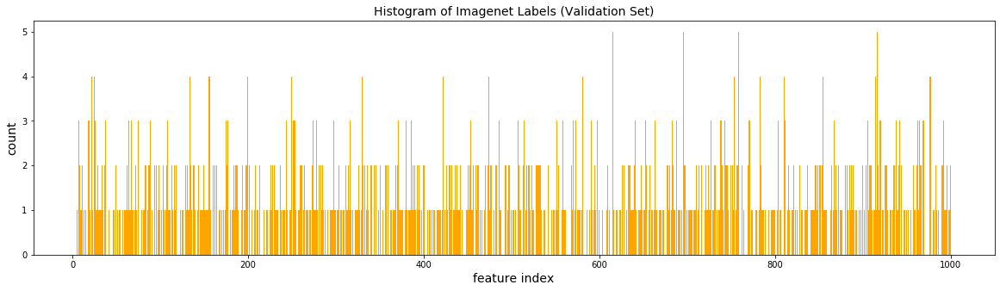

<Figure size 720x1440 with 0 Axes>

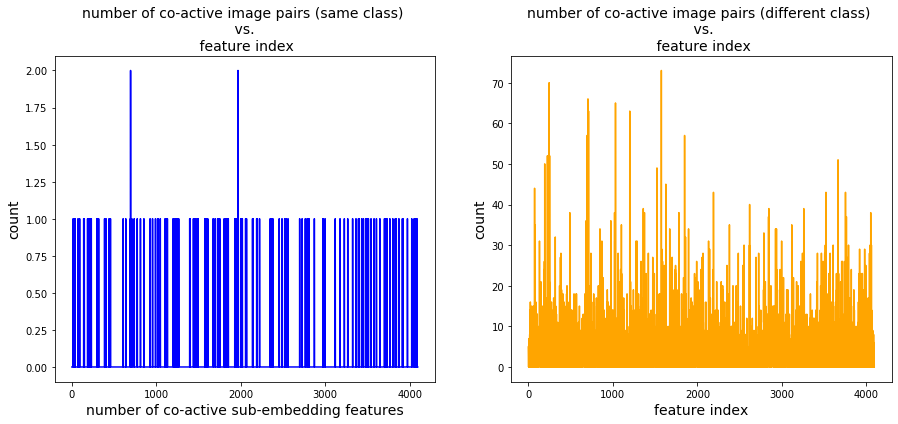

Text(0.5, 0, 'feature index')

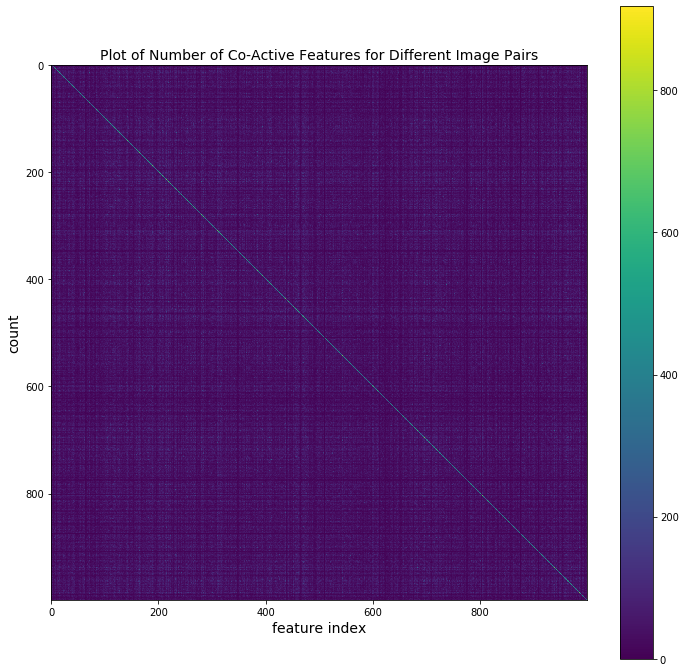

In [25]:
plt.figure(figsize=(20,5))
plt.title('Histogram of Imagenet Labels (Validation Set)', fontsize=14)
plt.hist(val_labels,color='orange', bins=1000)
plt.ylabel('count',fontsize=14)
plt.xlabel('number of co-active sub-embedding features',fontsize=14)
plt.ylabel('count',fontsize=14)
plt.xlabel('feature index',fontsize=14)


feature_sums = feats_same+feats_diff


bins=np.linspace(np.min([np.min(feats_same),np.min(feats_diff)]),np.max([np.max(feats_same),np.max(feats_diff)]),100)
plt.figure(figsize=(10,20))
fig, axs = plt.subplots(1,2, figsize=(15,6))
axs[0].set_title('number of co-active image pairs (same class) \n vs. \n feature index', fontsize=14)
axs[0].plot(range(4096),feats_same,color='blue')
axs[0].set_ylabel('count',fontsize=14)
axs[0].set_xlabel('number of co-active sub-embedding features',fontsize=14)
axs[1].set_title('number of co-active image pairs (different class) \n vs.\n feature index', fontsize=14)
axs[1].plot(range(4096),feats_diff,color='orange')
axs[1].set_ylabel('count',fontsize=14)
axs[1].set_xlabel('number of co-active sub-embedding features',fontsize=14)
plt.ylabel('count',fontsize=14)
plt.xlabel('feature index',fontsize=14)
plt.show()
plt.close()


co_active_feats_sum = np.squeeze(np.sum(co_active_feats, axis=1))
plt.figure(figsize=(12,12))
plt.title('Plot of Number of Co-Active Features for Different Image Pairs', fontsize=14)
plt.imshow(co_active_feats_sum)
plt.colorbar()
plt.ylabel('count',fontsize=14)
plt.xlabel('number of co-active sembedding features',fontsize=14)
plt.ylabel('count',fontsize=14)
plt.xlabel('feature index',fontsize=14)


# Visualize Top-10 Features Most Co-Active Across All Image Pairs

feature  1574
number of co-active pairs from same class =  1.0
number of co-active pairs from diff class =  73.0


 Images with the largest sum of feature values 
 



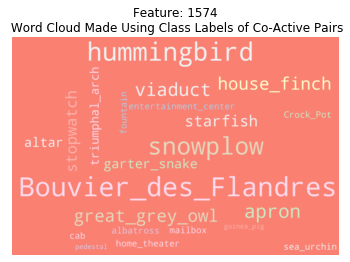

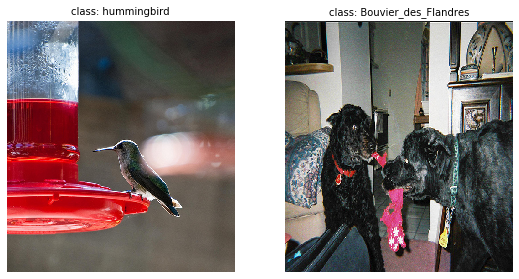

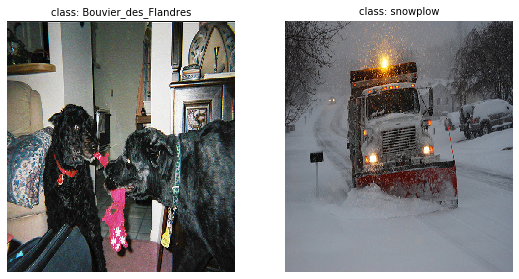

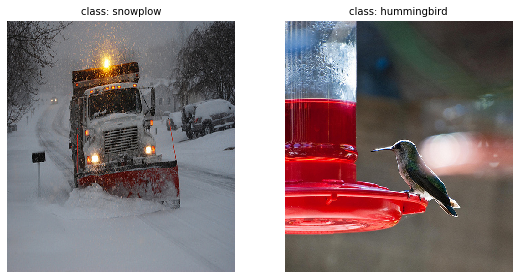

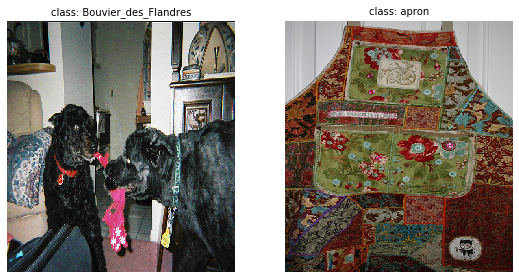

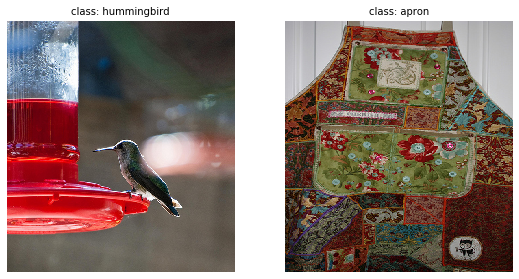

feature  246
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  70.0


 Images with the largest sum of feature values 
 



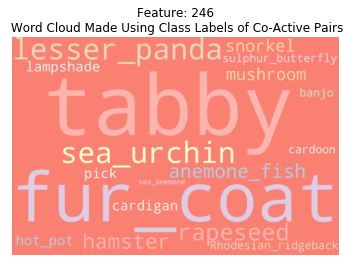

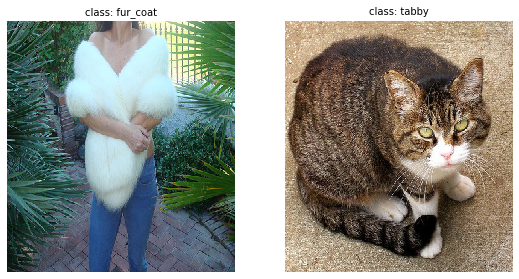

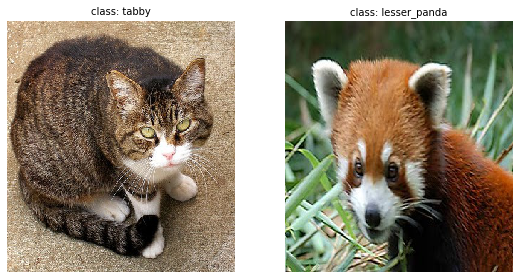

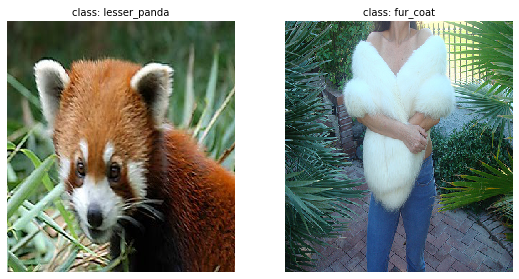

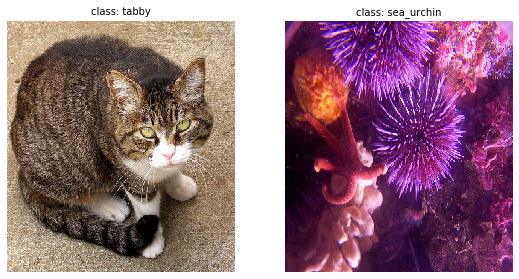

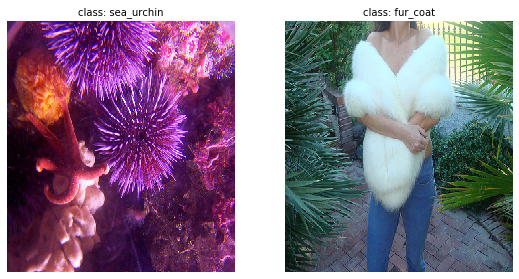

feature  705
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  66.0


 Images with the largest sum of feature values 
 



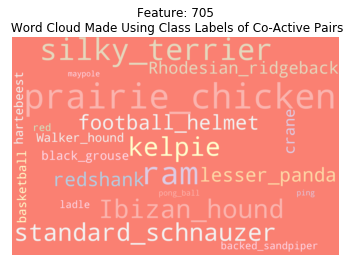

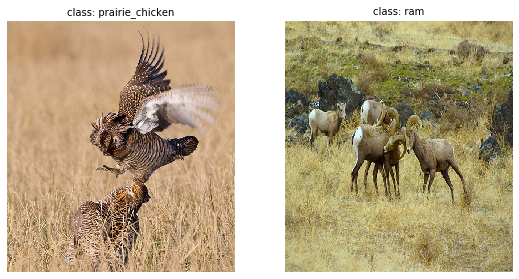

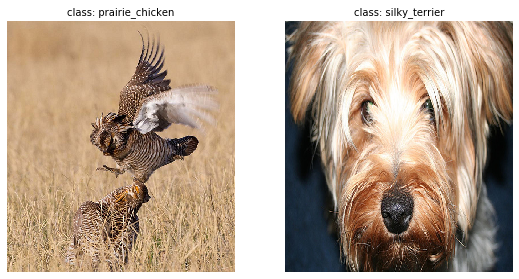

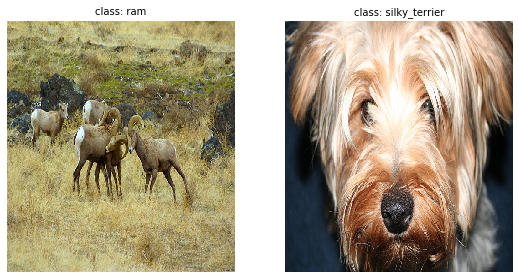

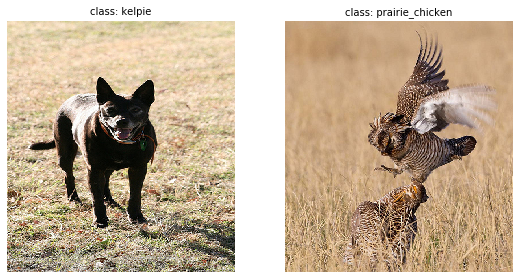

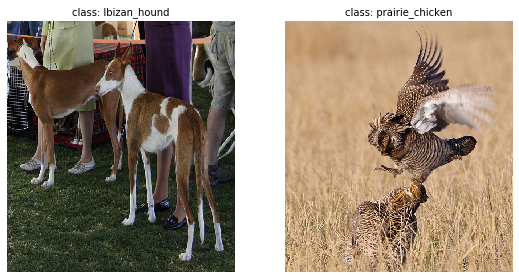

feature  1031
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  65.0


 Images with the largest sum of feature values 
 



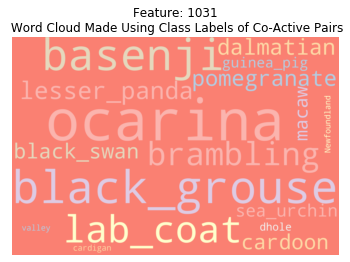

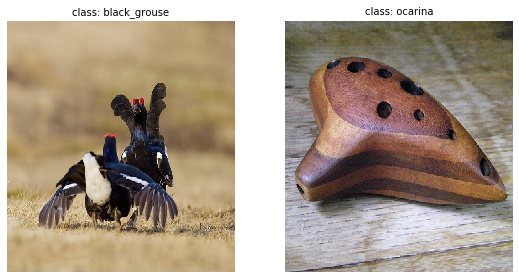

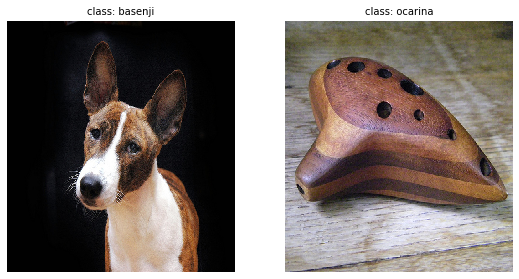

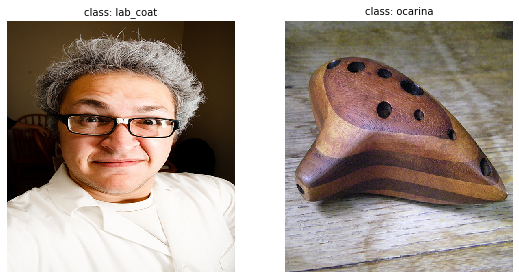

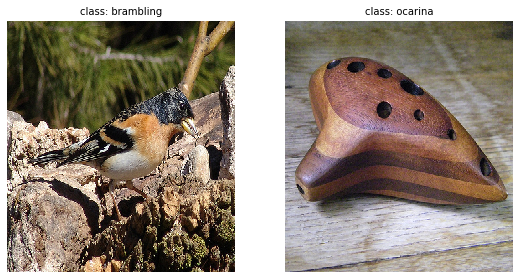

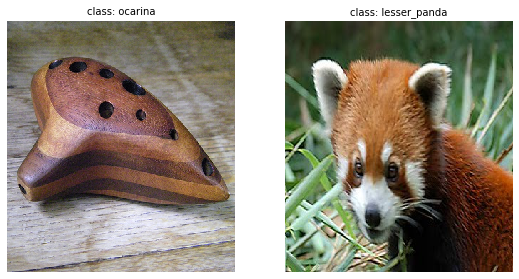

feature  1200
number of co-active pairs from same class =  1.0
number of co-active pairs from diff class =  63.0


 Images with the largest sum of feature values 
 



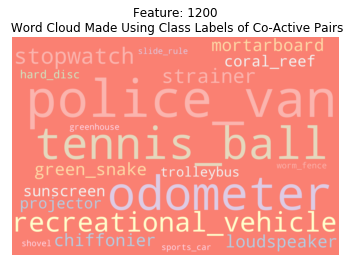

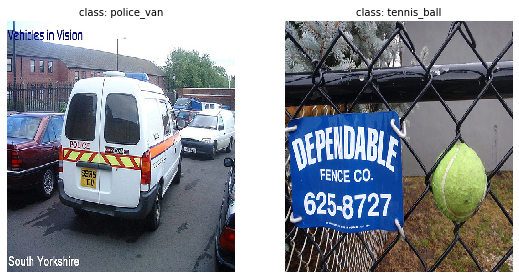

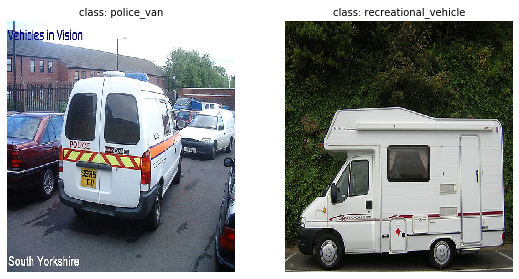

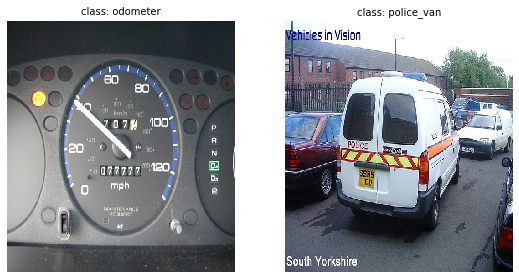

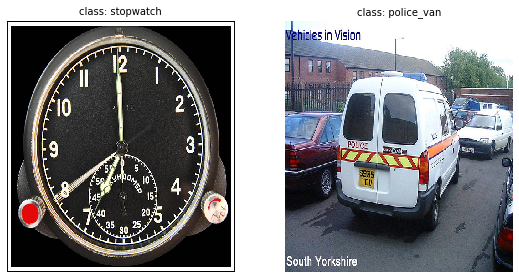

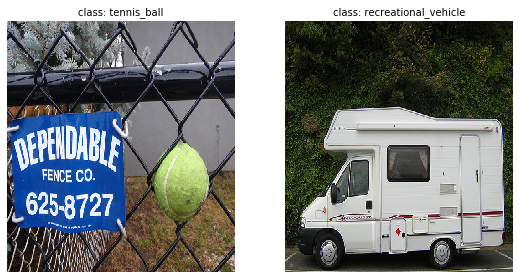

feature  712
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  63.0


 Images with the largest sum of feature values 
 



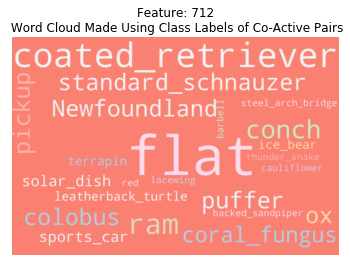

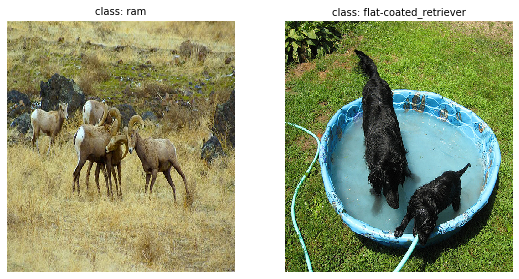

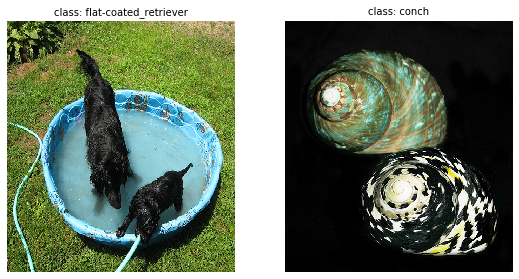

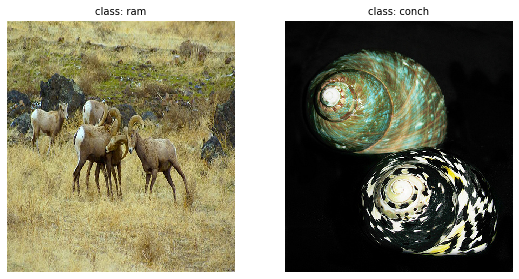

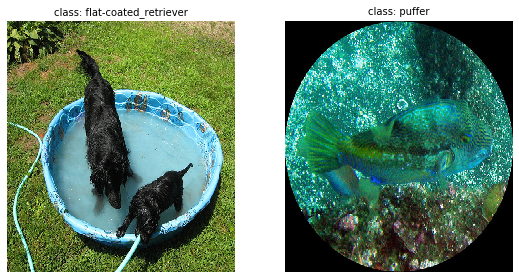

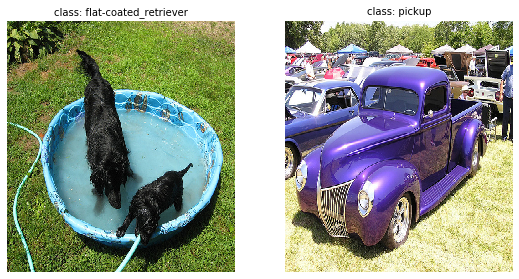

feature  695
number of co-active pairs from same class =  2.0
number of co-active pairs from diff class =  57.0


 Images with the largest sum of feature values 
 



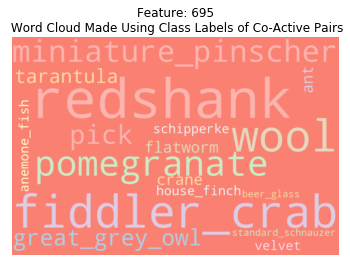

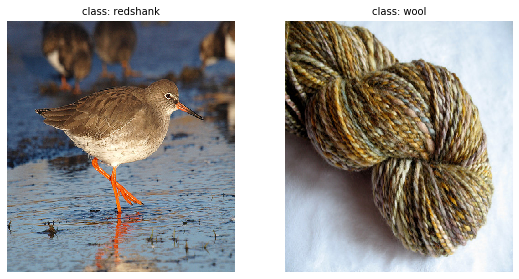

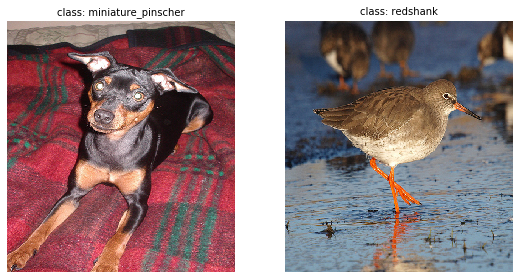

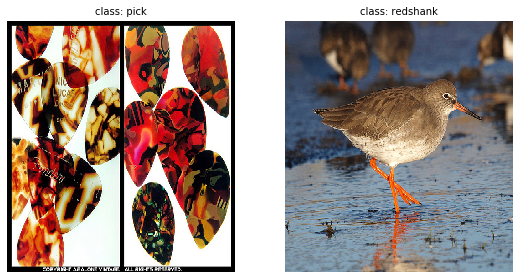

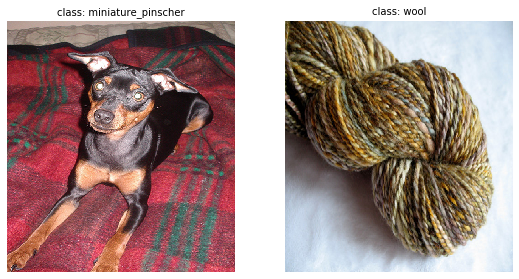

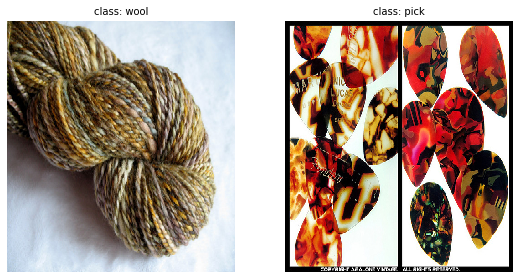

feature  1849
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  57.0


 Images with the largest sum of feature values 
 



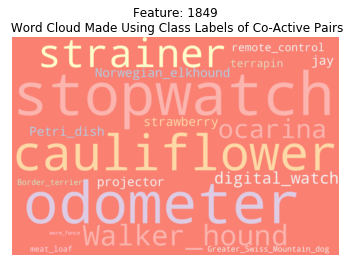

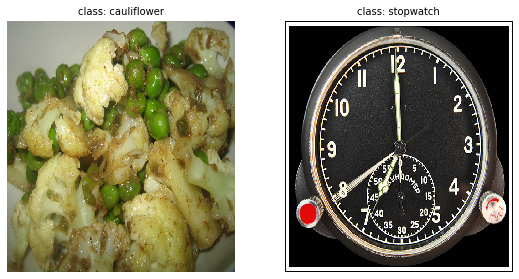

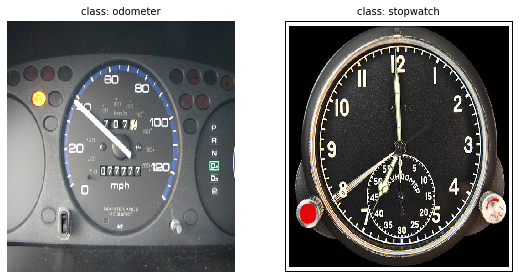

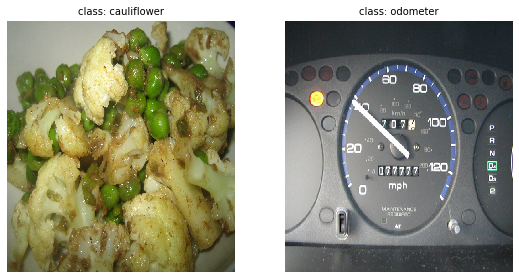

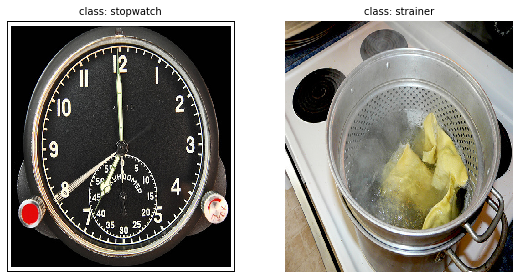

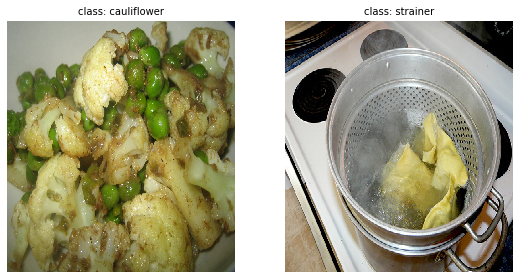

feature  225
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  52.0


 Images with the largest sum of feature values 
 



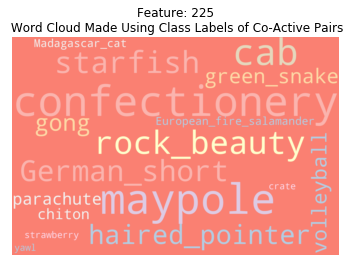

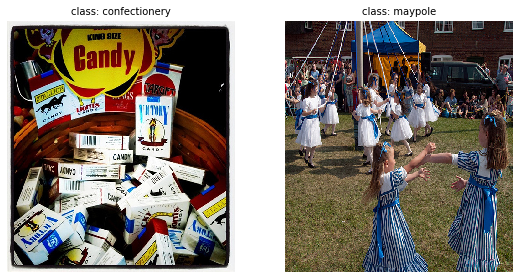

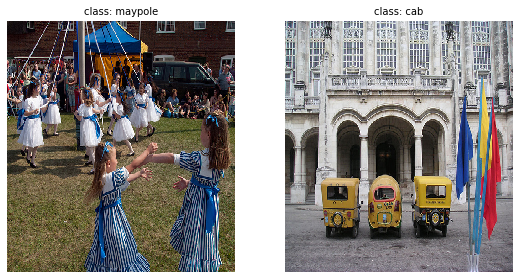

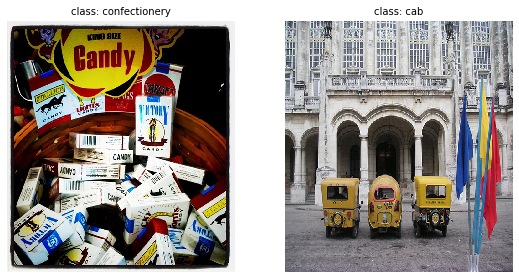

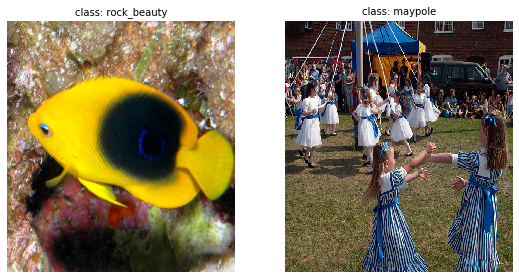

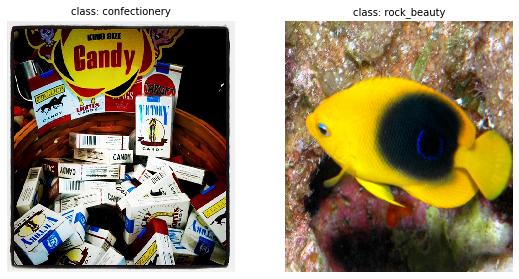

feature  251
number of co-active pairs from same class =  0.0
number of co-active pairs from diff class =  52.0


 Images with the largest sum of feature values 
 



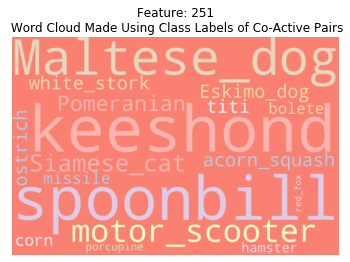

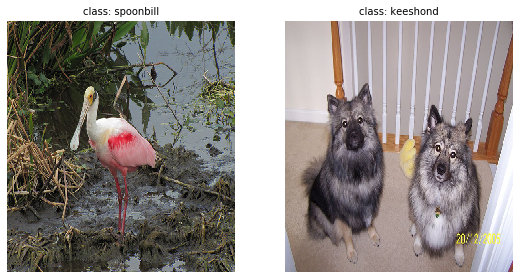

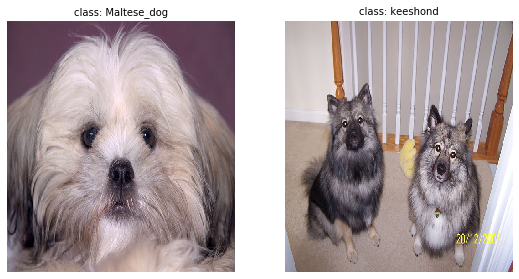

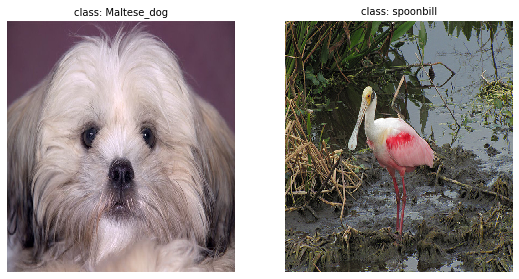

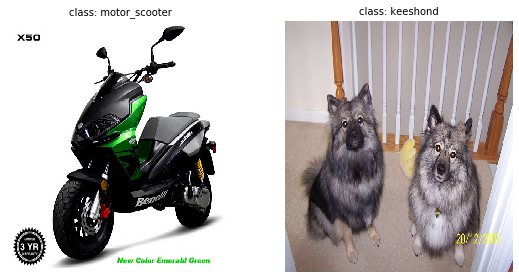

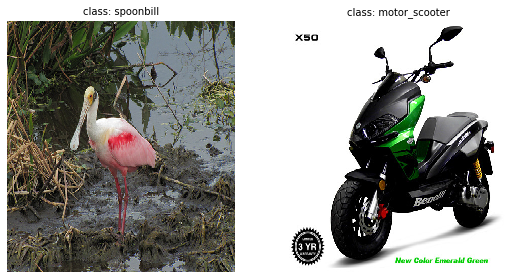

In [29]:
sorted_feats_same = np.argsort(-feature_sums.flatten())[:10]



for feature in sorted_feats_same:
    # get sum of activations for a features
    print('feature ',feature)
    print('number of co-active pairs from same class = ',feats_same[feature])
    print('number of co-active pairs from diff class = ',feats_diff[feature])
    
    #plot the feature cloud
    
    wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(feature_cloud[feature])

    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.title('Feature: '+str(feature)+'\n Word Cloud Made Using Class Labels of Co-Active Pairs')
    co_active_sum_of_activations_sorted_args = np.load('numpy_files/co_active_sum_of_sub_activations_sorted_args_'+str(feature)+'.npy')
    list_of_sorted_indices = []
    for ind in range(len(co_active_sum_of_activations_sorted_args)):
        x = int(co_active_sum_of_activations_sorted_args[ind]/num_selected)
        y = co_active_sum_of_activations_sorted_args[ind]%num_selected
        list_of_sorted_indices.append((x,y))
          
    print('\n\n Images with the largest sum of feature values \n \n')
    # display pairs with highest activations
    pair_count = 1
    count = 0
    for ind in range(0,100,2):
        x,y = list_of_sorted_indices[ind][0], list_of_sorted_indices[ind][1]
        #if co_active_feats[x,feature,y] == 0:
            #break
        if x != y:
            count += 1
            class_x = val_labels[x]
            class_y = val_labels[y]
            label_x = label_dictionary[class_x]
            label_y = label_dictionary[class_y]
            fig,axs = plt.subplots(1,2, figsize = (8,4))
            pair_count += 1
            fig.tight_layout(pad=2)
            plt.subplots_adjust(top=1.0)
            img = mpimg.imread('random_pairs_2k_new/pcount_'+str(x)+'.jpg')
            axs[0].imshow(img, aspect="auto")
            axs[0].axis('off')
            axs[0].set_title('class: '+label_x,fontsize=10)
            img = mpimg.imread('random_pairs_2k_new/pcount_'+str(y)+'.jpg')
            axs[1].imshow(img, aspect="auto")
            axs[1].axis('off')
            axs[1].set_title('class: '+label_y,fontsize=10)
            plt.show()
            plt.close()
        if(count == 5):
            break